In [11]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.stem import WordNetLemmatizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [12]:
import pandas as pd
file_path = '/content/singapore_airlines_reviews.csv'
df = pd.read_csv(file_path)
print(df.head())


              published_date published_platform  rating    type  \
0  2024-03-12T14:41:14-04:00            Desktop       3  review   
1  2024-03-11T19:39:13-04:00            Desktop       5  review   
2  2024-03-11T12:20:23-04:00            Desktop       1  review   
3  2024-03-11T07:12:27-04:00            Desktop       5  review   
4  2024-03-10T05:34:18-04:00            Desktop       2  review   

                                                text  \
0  We used this airline to go from Singapore to L...   
1  The service on Singapore Airlines Suites Class...   
2  Booked, paid and received email confirmation f...   
3  Best airline in the world, seats, food, servic...   
4  Premium Economy Seating on Singapore Airlines ...   

                                               title  helpful_votes  
0                                                 Ok              0  
1  The service in Suites Class makes one feel lik...              0  
2                         Don’t give them your mon

In [13]:
# Check for missing data
missing_data = df[df['text'].isna()]
print(missing_data)

Empty DataFrame
Columns: [published_date, published_platform, rating, type, text, title, helpful_votes]
Index: []


In [14]:
# unified time zone
df['published_date'] = pd.to_datetime(df['published_date'], errors='coerce')

In [15]:
# Adjusts the date and time format and sets the time zone to UTC
import pandas as pd
df['published_date'] = pd.to_datetime(df['published_date'], utc=True)

In [16]:
import matplotlib.dates as mdates
df['published_date'] = pd.to_datetime(df['published_date'].dt.strftime('%Y-%m-%d'))

In [17]:
pip install text_preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 MB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 12.9 MB/s eta 0:00:00


In [18]:
pip install nltk

In [19]:
# Creates a list of text, containing all the elements of the column named text in the DataFrame
text= [x for x in df['text']]

In [20]:
# Remove special characters
import re
texts = [re.sub(r"[~.,%/:;?_&+*=!-]", " ", text) for text in text]

In [21]:
# Numeric characters (0 to 9) in elements are replaced with spaces
texts = [re.sub(r"[0-9]"," ",text) for text in texts]

In [22]:
from text_preprocessing import preprocess_text
from text_preprocessing import to_lower, remove_email, remove_url, remove_punctuation
preprocess_functions = [to_lower, remove_email, remove_url, remove_punctuation]

texts = [preprocess_text(text,preprocess_functions) for text in texts]

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [23]:
def remove_emojis(text):
    # Use a wide range of Unicode to match and remove emojis
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags
        u"\U00002702-\U000027B0"  # Dingbats
        u"\U000024C2-\U0001F251"  # Enclosed characters
        u"\U0001F900-\U0001F9FF"  # Supplemental Symbols and Pictographs
        u"\U0001FA70-\U0001FAFF"  # Symbols and Pictographs Extended-A
        u"\U00002702-\U000027B0"  # Dingbats
        u"\U0001F600-\U0001F64F"  # Additional emoticons
        u"\U00002500-\U00002BEF"  # Various symbols
        u"\U0001F680-\U0001F6FF"  # More transport and map symbols
        u"\U0001F1E0-\U0001F1FF"  # Flags
        u"\U0001F1E6-\U0001F1FF"  # Flags
        u"\U0001F600-\U0001F64F"
        u"\U0001F300-\U0001F5FF"
        u"\U0001F680-\U0001F6FF"
        u"\U0001F1E0-\U0001F1FF"
        "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

texts = [remove_emojis(text)for text in texts]

In [24]:
df['text'] = texts

In [25]:
import nltk
from nltk.corpus import stopwords

# Download the stop word
nltk.download('stopwords')
stop_words = stopwords.words('english')

def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])

df['text'] = df['text'].apply(lambda text: cleaning_stopwords(text))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
new_df = df[['published_date', 'text', 'rating']]
new_df

,published_date,text,rating
0,2024-03-12,used airline go singapore london heathrow issu...,3
1,2024-03-11,service singapore airlines suites class nothin...,5
2,2024-03-11,booked paid received email confirmation extra ...,1
3,2024-03-11,best airline world seats food service brillian...,5
4,2024-03-10,premium economy seating singapore airlines nar...,2
...,...,...,...
9995,2018-08-06,first part done singapore airlines acceptable ...,5
9996,2018-08-06,great flight singapore air great unique servic...,5
9997,2018-08-06,flew business class frankfurt via singapore br...,5
9998,2018-08-06,always aircraft spotlessly presented boarding ...,4


In [27]:
new_df.to_csv('new_df.csv', index=False)

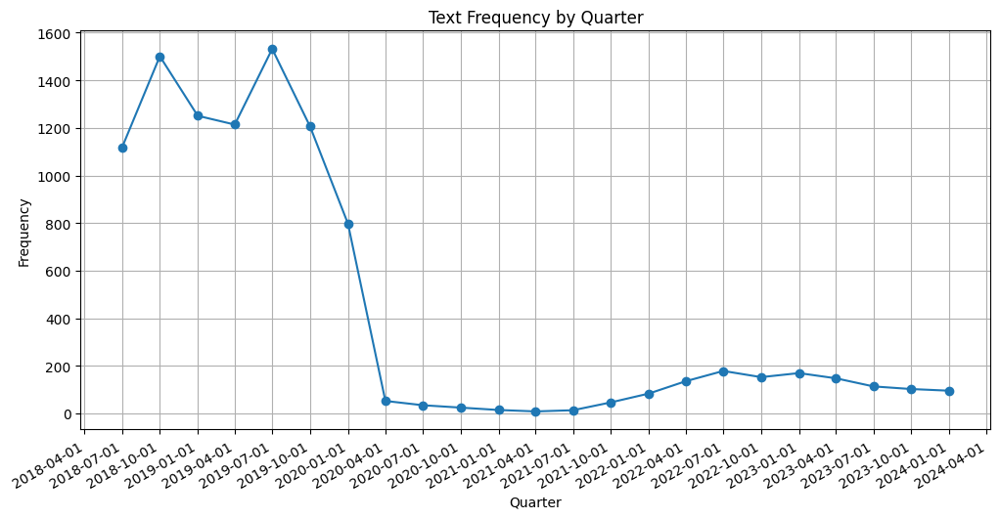

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


# Grouping by quarter based on published_date columns
frequency = new_df.groupby(new_df['published_date'].dt.to_period('Q'))['text'].count()
frequency.index = frequency.index.to_timestamp()

# Draw a line chart
plt.figure(figsize=(12, 6))
plt.plot(frequency.index, frequency.values, marker='o', linestyle='-')

# Set the chart title and axis label
plt.title('Text Frequency by Quarter')
plt.xlabel('Quarter')
plt.ylabel('Frequency')

plt.gca().xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.show()

2019 describe

In [29]:
#Selected rows for 2019
start_date = pd.Timestamp('2019-01-01')
end_date = pd.Timestamp('2019-12-31')

data_2019 = new_df[(new_df['published_date'] >= start_date) & (new_df['published_date'] <= end_date)]
data_2019

,published_date,text,rating
2179,2019-12-31,traveled family singapore christmas holiday tr...,3
2180,2019-12-31,plane ride excellent new plane difference lay ...,5
2181,2019-12-31,lots good food amenities menu even said provid...,4
2182,2019-12-31,night flight back narita hour mins children di...,4
2183,2019-12-31,singapore airport airlines rank amongst best o...,2
...,...,...,...
7377,2019-01-01,flight day arrived singapore returning city li...,5
7378,2019-01-01,first time flown singapore airlines wont last ...,5
7379,2019-01-01,meal really good elements customer service fri...,3
7380,2019-01-01,flight delhi bali via singaore double decker a...,5


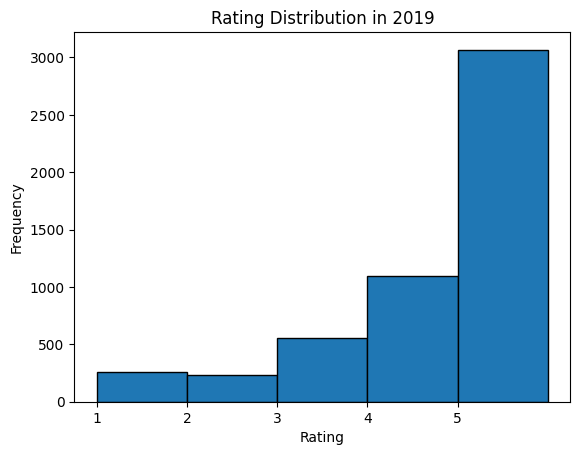

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a histogram
plt.hist(data_2019['rating'], bins=5, range=(1, 6), edgecolor='black')
plt.xticks(range(1, 6))
plt.title('Rating Distribution in 2019')
plt.xlabel('Rating')
plt.ylabel('Frequency')

# Display the histogram
plt.show()


2023-2024 describe

In [31]:
# Selected rows for 2023-2024
start_date = pd.Timestamp('2023-01-01')
end_date = pd.Timestamp('2024-04-01')
data_2023_2024 = new_df[(new_df['published_date'] >= start_date) & (df['published_date'] <= end_date)]

print(data_2023_2024)

    published_date                                               text  rating
0       2024-03-12  used airline go singapore london heathrow issu...       3
1       2024-03-11  service singapore airlines suites class nothin...       5
2       2024-03-11  booked paid received email confirmation extra ...       1
3       2024-03-11  best airline world seats food service brillian...       5
4       2024-03-10  premium economy seating singapore airlines nar...       2
..             ...                                                ...     ...
626     2023-01-02  best service best hospitality staffs polite fe...       5
627     2023-01-02  flew singapore airlines several flights decemb...       3
628     2023-01-01  singapore airlines lost checked bags trip make...       1
629     2023-01-01  delightful experience singapore airlines fligh...       5
630     2023-01-01  checked baggage time received travelling weddi...       1

[631 rows x 3 columns]


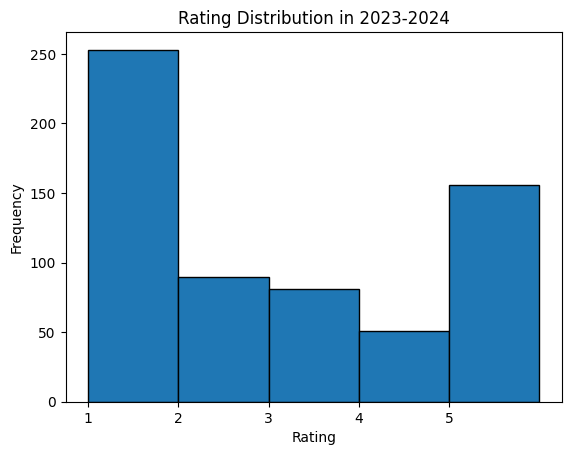

In [32]:
plt.hist(data_2023_2024['rating'], bins=5, range=(1, 6), edgecolor='black')
# Plotting histograms for 2023-2024
plt.xticks(range(1, 6))
plt.title('Rating Distribution in 2023-2024')
plt.xlabel('Rating')
plt.ylabel('Frequency')

# The histogram is displayed
plt.show()

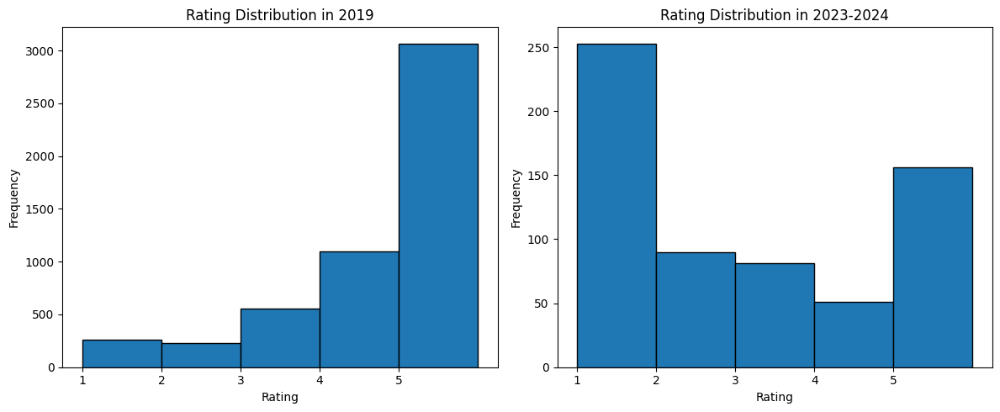

In [33]:
import matplotlib.pyplot as plt

# Create a figure and axes for subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot histogram for 2019 on the left subplot
axs[0].hist(data_2019['rating'], bins=5, range=(1, 6), edgecolor='black')
axs[0].set_title('Rating Distribution in 2019')
axs[0].set_xlabel('Rating')
axs[0].set_ylabel('Frequency')
axs[0].set_xticks(range(1, 6))

# Plot histogram for 2023-2024 on the right subplot
axs[1].hist(data_2023_2024['rating'], bins=5, range=(1, 6), edgecolor='black')
axs[1].set_title('Rating Distribution in 2023-2024')
axs[1].set_xlabel('Rating')
axs[1].set_ylabel('Frequency')
axs[1].set_xticks(range(1, 6))

plt.tight_layout()

# Show the plots
plt.show()


In [144]:
# Select the row with the rating column 4
rating4 = data_2023_2024[data_2023_2024['rating'] == 4]
rating4 = selected_rows['text']
rating4

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


28     travelled man bkk via singapore return outboun...
40     good flight left time arrived early food board...
47     everything trip amazing plane longest part jou...
59     bigger scheme things among airlines provides h...
71     airline customer service baggage ground crew f...
75     great customer service singapore airlines melb...
90     singapore airlines good quality airline howeve...
96     flying singapore airlines years question airli...
112    experience good outbound inbound flights trave...
128    generally excellent flights wifi service food ...
136    summer holiday went trip form hong kong singap...
137    wife recently travelled melbourne singapore is...
154    partner decided travel australia singapore air...
159    recently three flights singapore air recent tr...
173    last time flew singapore airlines economy pre ...
175    decent airline room improvement ive opportunit...
177    hate self check luckily somebody perth help wh...
191    family used two tickets 

In [145]:
# save the row with the rating column 4 to csv
rating4.to_csv('rating4_texts.csv', index=False)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


sentiment analyses

In [34]:
!pip install transformers torch

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

2023-2024

In [35]:
start_date = pd.Timestamp('2023-01-01')
end_date = pd.Timestamp('2024-04-01')

data_2023_2024 = new_df[(new_df['published_date'] >= start_date) & (df['published_date'] <= end_date)]
print(data_2023_2024)

    published_date                                               text  rating
0       2024-03-12  used airline go singapore london heathrow issu...       3
1       2024-03-11  service singapore airlines suites class nothin...       5
2       2024-03-11  booked paid received email confirmation extra ...       1
3       2024-03-11  best airline world seats food service brillian...       5
4       2024-03-10  premium economy seating singapore airlines nar...       2
..             ...                                                ...     ...
626     2023-01-02  best service best hospitality staffs polite fe...       5
627     2023-01-02  flew singapore airlines several flights decemb...       3
628     2023-01-01  singapore airlines lost checked bags trip make...       1
629     2023-01-01  delightful experience singapore airlines fligh...       5
630     2023-01-01  checked baggage time received travelling weddi...       1

[631 rows x 3 columns]


In [148]:
import torch
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from scipy.special import softmax

# Load pre-trained model and tokenizer
model_name = 'cardiffnlp/twitter-roberta-base-sentiment'
tokenizer = RobertaTokenizer.from_pretrained(model_name)
model = RobertaForSequenceClassification.from_pretrained(model_name)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [31]:
def sentiment_score(review_text):
    # Encode the text
    encoded_review = tokenizer.encode_plus(
        review_text,
        max_length=512,
        add_special_tokens=True,
        return_token_type_ids=False,
        pad_to_max_length=True,
        return_attention_mask=True,
        return_tensors='pt',
    )

    # Forward pass, get logits
    input_ids = encoded_review['input_ids'].to('cpu')
    attention_mask = encoded_review['attention_mask'].to('cpu')

    with torch.no_grad():
        output = model(input_ids, attention_mask)
        scores = output[0][0].detach().numpy()
        scores = softmax(scores)

    # Access to sentiment categories with maximum probability
    labels = ['negative', 'neutral', 'positive']
    sentiment = labels[scores.argmax()]
    return sentiment, scores

texts_column = data_2023_2024['text']
sentiments = []
texts = []

for text in texts_column:
    sentiment, scores = sentiment_score(text)  # Calculate sentiment score
    texts.append(text)
    sentiments.append(sentiment)

    print(f'Text: {text}')
    print(f'Sentiment: {sentiment}')
    print(f'Scores: {scores}')

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2674: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


Text: used airline go singapore london heathrow issues tickets cancelled one tickets trying get sorted cost lot money due roaming charges lengthy phone calls needed get ticket reinstated trying charge varying amounts resolve poor service got airport check desk due issue meant online check couldnt done premium economy spacious two seats either side plane seats middle plane seemed relatively new brand new legroom good seats wider bigger arm rest two seats fold away tray tables good choice movies things tv shows games etc food ok didnt seem much different economy standard flight crew seemed friendly enough didnt really go isles drinks maybe twice whole hour flight airlines would done quite often overall flight ok seats comfy legroom good food ok flight crew could attentive especially premium economy would expect service slightly better economy
Sentiment: positive
Scores: [0.08643743 0.37521133 0.5383513 ]


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:2674: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


Text: service singapore airlines suites class nothing excellent cabin crew warm friendly importantly came across sincere genuine throughout flight interacted leading stewardess sharifah went way ensure comfortable well taken care saw patrolling cabin consistently check needed anythingi could see looking suite always read assist us even offered make bed breakfast run could rest asked could walk around decks aircraft sharifah volunteered show around knowledgeable configurations aircraft even pointed best seats cabin class walked suites class cabin resembles private cabins onboard sleeper trains gives suites class passengers form privacy cut holes cabin doors shape flower design somewhat reduce privacy got suites class cabins two lavatories front aircraft catering six suites class passengers lavatory right bigger two featuring vanity table toilet sink plenty space lavatory passengers change lalique pyjamas provided suites class passengers lavatory left smaller less luxurious passengers us

In [40]:
#Created DataFrame for df_2023_2024
df_2023_2024 = pd.DataFrame({'Text': texts, 'Sentiment': sentiments})

In [41]:
df_2023_2024

,Text,Sentiment
0,used airline go singapore london heathrow issu...,positive
1,service singapore airlines suites class nothin...,neutral
2,booked paid received email confirmation extra ...,negative
3,best airline world seats food service brillian...,positive
4,premium economy seating singapore airlines nar...,negative
...,...,...
626,best service best hospitality staffs polite fe...,positive
627,flew singapore airlines several flights decemb...,neutral
628,singapore airlines lost checked bags trip make...,negative
629,delightful experience singapore airlines fligh...,positive


In [46]:
# Save DataFrame with sentiment columns to 2023_2024_sentiment_data.csv
df_2023_2024.to_csv('2023_2024_sentiment_data.csv', index=False)

In [36]:
# open 2023_2024_sentiment_data.csv as df1
file_path = '/content/2023_2024_sentiment_data.csv'
df1 = pd.read_csv(file_path)
print(df1.head())

                                                Text Sentiment
0  used airline go singapore london heathrow issu...  positive
1  service singapore airlines suites class nothin...   neutral
2  booked paid received email confirmation extra ...  negative
3  best airline world seats food service brillian...  positive
4  premium economy seating singapore airlines nar...  negative


In [186]:
df1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Text,Sentiment
0,used airline go singapore london heathrow issu...,positive
1,service singapore airlines suites class nothin...,neutral
2,booked paid received email confirmation extra ...,negative
3,best airline world seats food service brillian...,positive
4,premium economy seating singapore airlines nar...,negative
...,...,...
626,best service best hospitality staffs polite fe...,positive
627,flew singapore airlines several flights decemb...,neutral
628,singapore airlines lost checked bags trip make...,negative
629,delightful experience singapore airlines fligh...,positive


In [37]:
# Setting the training set to 0.89 to test the accuracy of the sentiment analysis model
from sklearn.model_selection import train_test_split
trainsize = 0.89
X = df1['Text']
y = df1['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=1-trainsize,random_state=123)

In [38]:
from sklearn.feature_extraction.text import CountVectorizer
vec = CountVectorizer(ngram_range=(2,2), max_features=500000)
X_train = vec.fit_transform(X_train)
X_test = vec.transform(X_test)

Training Accuracy : 0.9982174688057041
Test Accuracy : 0.7
[[33  2  6]
 [ 7  3  1]
 [ 3  2 13]]


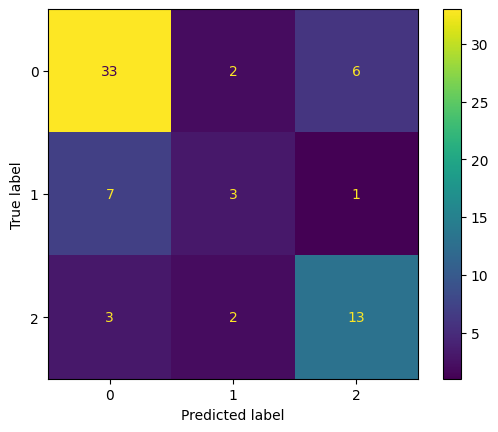

In [39]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
model_NB = MultinomialNB()
model_NB.fit(X_train, y_train)

y_pred = model_NB.predict(X_test)

print("Training Accuracy :", model_NB.score(X_train, y_train))
print("Test Accuracy :", model_NB.score(X_test, y_test))
# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

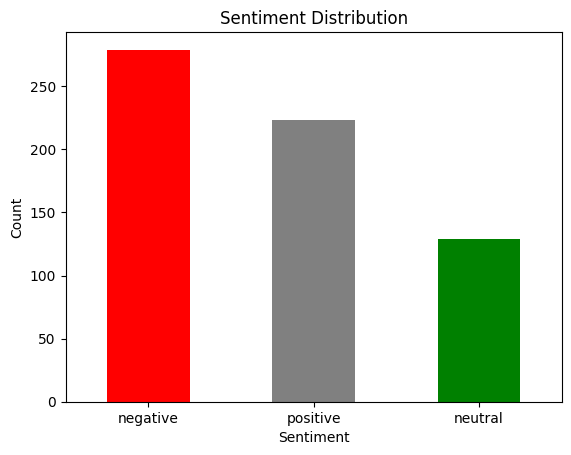

In [40]:
import matplotlib.pyplot as plt

# Count the occurrences of each sentiment category
sentiment_counts = df1['Sentiment'].value_counts()


sentiment_counts.plot(kind='bar', color=['red', 'grey', 'green'])
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)
# Show the plot
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


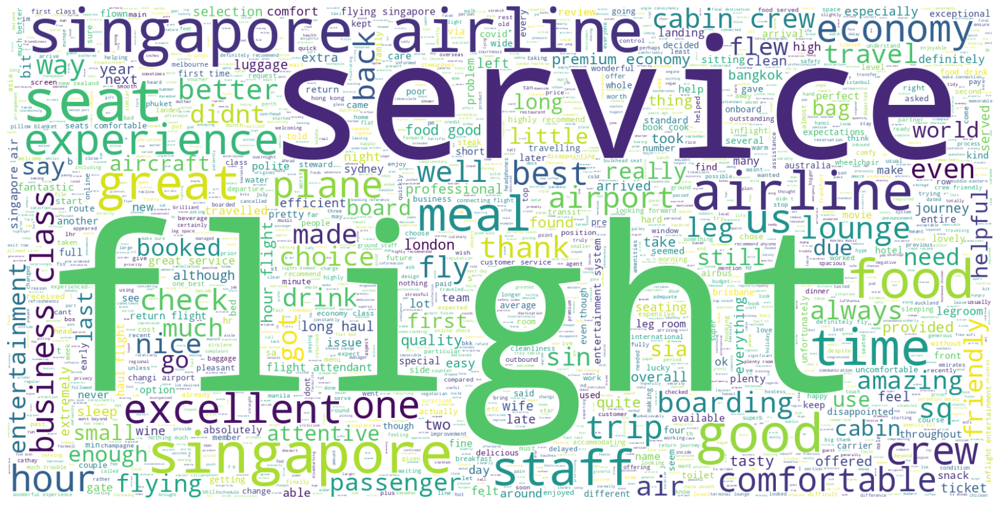

In [155]:
from wordcloud import WordCloud

# Extract text for positive emotion categories
positive_texts = df1[df1['Sentiment'] == 'positive']['Text']

# Create and draw WordCloud objects
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800).generate(" ".join(positive_texts))

plt.figure(figsize=(20, 20))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [156]:
# Cleaning and removing the above stop words list from the text column in new_df
stop_words = stopwords.words('english')
new_stopwords = [ "singapore", "flight", "airline", "airlines", "one", "flights"]
stop_words.extend(new_stopwords)
## Adds a new stop word to the stop word list
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])

# Apply the function to clean up stop words to the 'text' column of new_df
df1['Text'] = df1['Text'].apply(lambda text: cleaning_stopwords(text))

print(df1['Text'].head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0    used go london heathrow issues tickets cancell...
1    service suites class nothing excellent cabin c...
2    booked paid received email confirmation extra ...
3    best world seats food service brilliant crew f...
4    premium economy seating narrow seats poor leg ...
Name: Text, dtype: object


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


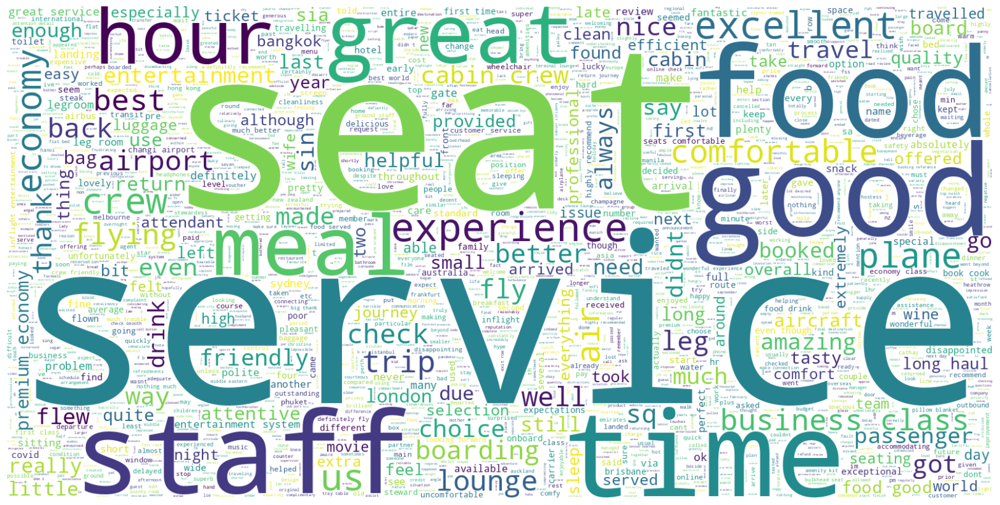

In [157]:
# Text extraction of positive affective categories after the use of deactivated words
positive_texts = df1[df1['Sentiment'] == 'positive']['Text']

wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800).generate(" ".join(positive_texts))

plt.figure(figsize=(20, 20))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


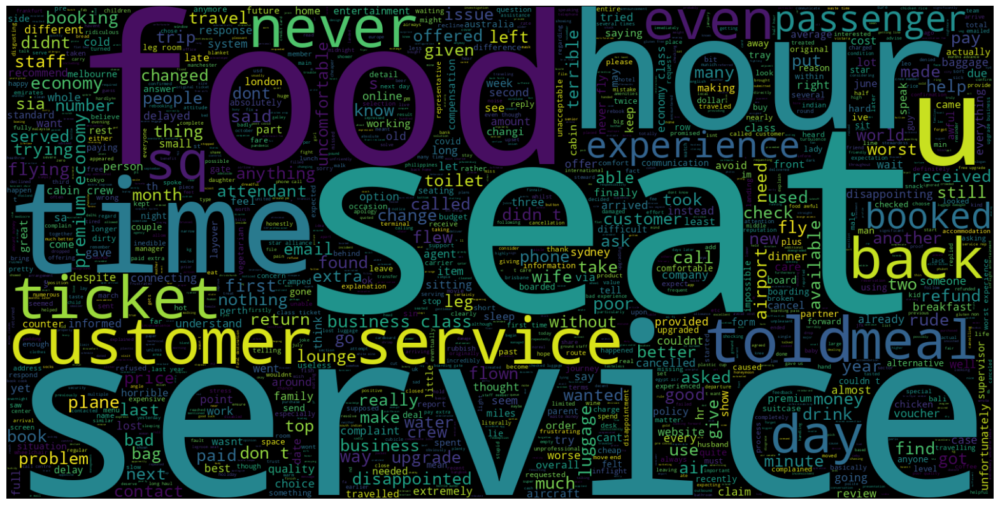

In [158]:
# Text extraction of negative affective categories after the use of deactivated words
negative_texts = df1[df1['Sentiment'] == 'negative']['Text']

wc = WordCloud(background_color='black', max_words=2000, width=1600, height=800).generate(" ".join(negative_texts))
plt.figure(figsize=(20, 20))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [159]:
# Cleaning and removing the above stop words list from the text column in new_df
stop_words = stopwords.words('english')
new_stopwords = ["sq", "much"]
stop_words.extend(new_stopwords)
# Adds a new stop word
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])

# Apply the function to clean up stop words to the 'text' column of new_df
df1['Text'] = df1['Text'].apply(lambda text: cleaning_stopwords(text))

print(df1['Text'].head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0    used go london heathrow issues tickets cancell...
1    service suites class nothing excellent cabin c...
2    booked paid received email confirmation extra ...
3    best world seats food service brilliant crew f...
4    premium economy seating narrow seats poor leg ...
Name: Text, dtype: object


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


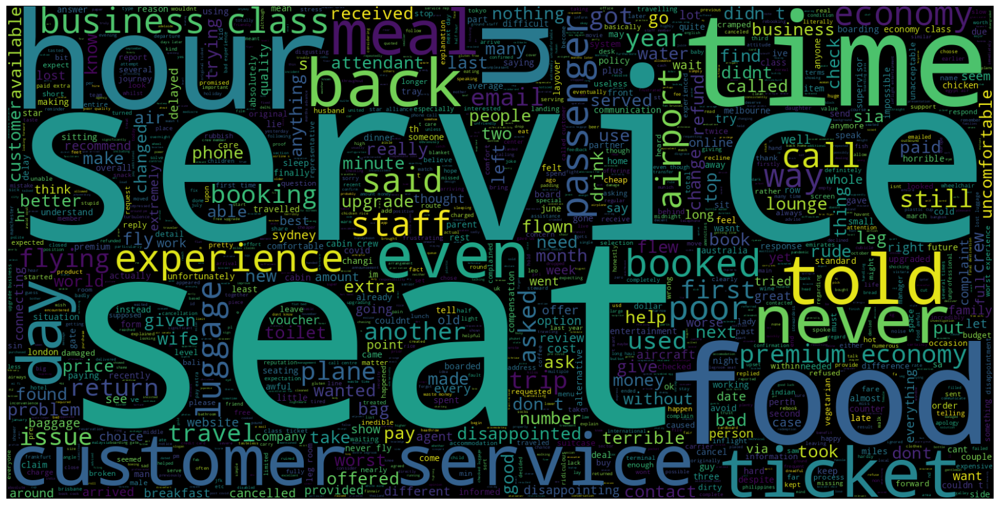

In [160]:
negative_texts = df1[df1['Sentiment'] == 'negative']['Text']

wc = WordCloud(background_color='black', max_words=2000, width=1600, height=800).generate(" ".join(negative_texts))
plt.figure(figsize=(20, 20))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

**sentiment analysis for 2019**

In [ ]:
start_date = pd.Timestamp('2019-01-01')
end_date = pd.Timestamp('2019-12-31')


data_2019 = new_df[(new_df['published_date'] >= start_date) & (new_df['published_date'] <= end_date)]

print(data_2019)

     published_date                                               text  rating
2179     2019-12-31  traveled family singapore christmas holiday tr...       3
2180     2019-12-31  plane ride excellent new plane difference lay ...       5
2181     2019-12-31  lots good food amenities menu even said provid...       4
2182     2019-12-31  night flight back narita hour mins children di...       4
2183     2019-12-31  singapore airport airlines rank amongst best o...       2
...             ...                                                ...     ...
7377     2019-01-01  flight day arrived singapore returning city li...       5
7378     2019-01-01  first time flown singapore airlines wont last ...       5
7379     2019-01-01  meal really good elements customer service fri...       3
7380     2019-01-01  flight delhi bali via singaore double decker a...       5
7381     2019-01-01  travel bali via singapore amsterdam wife diarr...       5

[5203 rows x 3 columns]


In [ ]:
import torch
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from scipy.special import softmax

# Load pre-trained model and tokenizer
model_name = 'cardiffnlp/twitter-roberta-base-sentiment'
tokenizer = RobertaTokenizer.from_pretrained(model_name)
model = RobertaForSequenceClassification.from_pretrained(model_name)

In [ ]:
def sentiment_score(review_text):
    # Encode the text
    encoded_review = tokenizer.encode_plus(
        review_text,
        max_length=512,
        add_special_tokens=True,
        return_token_type_ids=False,
        pad_to_max_length=True,
        return_attention_mask=True,
        return_tensors='pt',
    )

    # Forward pass, get logits
    input_ids = encoded_review['input_ids'].to('cpu')
    attention_mask = encoded_review['attention_mask'].to('cpu')

    with torch.no_grad():
        output = model(input_ids, attention_mask)
        scores = output[0][0].detach().numpy()
        scores = softmax(scores)

    # Access to sentiment categories with maximum probability
    labels = ['negative', 'neutral', 'positive']
    sentiment = labels[scores.argmax()]
    return sentiment, scores

texts_column = data_2019['text']
sentiments = []
texts = []

for text in texts_column:
    sentiment, scores = sentiment_score(text)  # Calculate sentiment score
    texts.append(text)
    sentiments.append(sentiment)

    print(f'Text: {text}')
    print(f'Sentiment: {sentiment}')
    print(f'Scores: {scores}')

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Streaming output truncated to the last 5000 lines.
Sentiment: neutral
Scores: [0.1135649  0.45822772 0.4282074 ]
Text: never flown singapore airlines say one best cabin crew fantastic nothing much trouble food fine coffee hot inflight entertainment would complaint much watch overall great
Sentiment: positive
Scores: [0.01109026 0.04286261 0.94604707]
Text: inflight service impeccable sia great product people elevates whole experience flying professional personal time special call crew sin cdg flight apr
Sentiment: positive
Scores: [0.00498083 0.08927901 0.9057401 ]
Text: researched singapore airlines flew came best economy airlines really couldn’t see anything economy plenty room us husband ft choice films excellent meals absolutely gorgeous cheesecake yummy efficiency checking faultless always someone around need help use hopefully pretty soon foot note flew hong kong well singapore hong kong flew fabulous airline definitely recommend
Sentiment: positive
Scores: [0.00497741 0.02084523

In [ ]:
df_2019 = pd.DataFrame({'Text': texts, 'Sentiment': sentiments})

In [ ]:
df_2019.to_csv('2019_sentiment_data.csv', index=False)

In [41]:
file_path = '/content/2019_sentiment_data.csv'
df_2019 = pd.read_csv(file_path)
print(df_2019.head())

                                                Text Sentiment
0  traveled family singapore christmas holiday tr...   neutral
1  plane ride excellent new plane difference lay ...  positive
2  lots good food amenities menu even said provid...  positive
3  night flight back narita hour mins children di...  positive
4  singapore airport airlines rank amongst best o...   neutral


In [5]:
df_2019

,Text,Sentiment
0,traveled family singapore christmas holiday tr...,neutral
1,plane ride excellent new plane difference lay ...,positive
2,lots good food amenities menu even said provid...,positive
3,night flight back narita hour mins children di...,positive
4,singapore airport airlines rank amongst best o...,neutral
...,...,...
5198,flight day arrived singapore returning city li...,positive
5199,first time flown singapore airlines wont last ...,positive
5200,meal really good elements customer service fri...,positive
5201,flight delhi bali via singaore double decker a...,positive


In [42]:
# Testing the accuracy of the 2019 dataset using a sentiment analysis model
from sklearn.model_selection import train_test_split
trainsize = 0.7
X = df_2019['Text']
y = df_2019['Sentiment']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=1-trainsize,
                                         random_state=123)

In [43]:
from sklearn.feature_extraction.text import CountVectorizer
vec = CountVectorizer(ngram_range=(2,2), max_features=500000)
X_train = vec.fit_transform(X_train)
X_test = vec.transform(X_test)

Training Accuracy : 0.9945085118066996
Test Accuracy : 0.7604099935938501
[[   5   12  154]
 [   2    8  201]
 [   3    2 1174]]


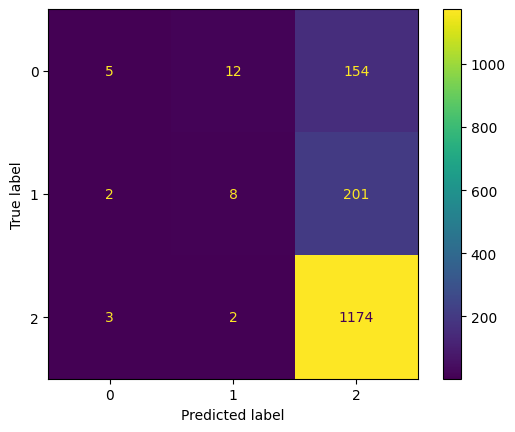

In [44]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

model_NB = MultinomialNB()
model_NB.fit(X_train, y_train)

y_pred = model_NB.predict(X_test)

print("Training Accuracy :", model_NB.score(X_train, y_train))
print("Test Accuracy :", model_NB.score(X_test, y_test))
# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

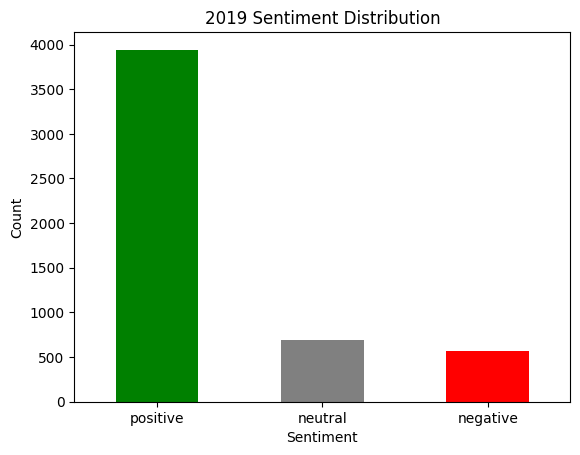

In [45]:
import matplotlib.pyplot as plt

# Count the occurrences of each sentiment category
sentiment_counts = df_2019['Sentiment'].value_counts()

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['green', 'grey', 'red'])
plt.title('2019 Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

# Show the plot
plt.show()

In [ ]:
# Cleaning and removing the above stop words list from the text column in new_df
stop_words = stopwords.words('english')
new_stopwords = [ "singapore", "flight", "airline", "airlines", "one", "flights"]
stop_words.extend(new_stopwords)

# Add new stop words
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])
df_2019['Text'] = df_2019['Text'].apply(lambda text: cleaning_stopwords(text))
print(df_2019['Text'].head())

0    traveled family christmas holiday trip food ho...
1    plane ride excellent new plane difference lay ...
2    lots good food amenities menu even said provid...
3    night back narita hour mins children didn’t li...
4    airport rank amongst best obviously expectatio...
Name: Text, dtype: object


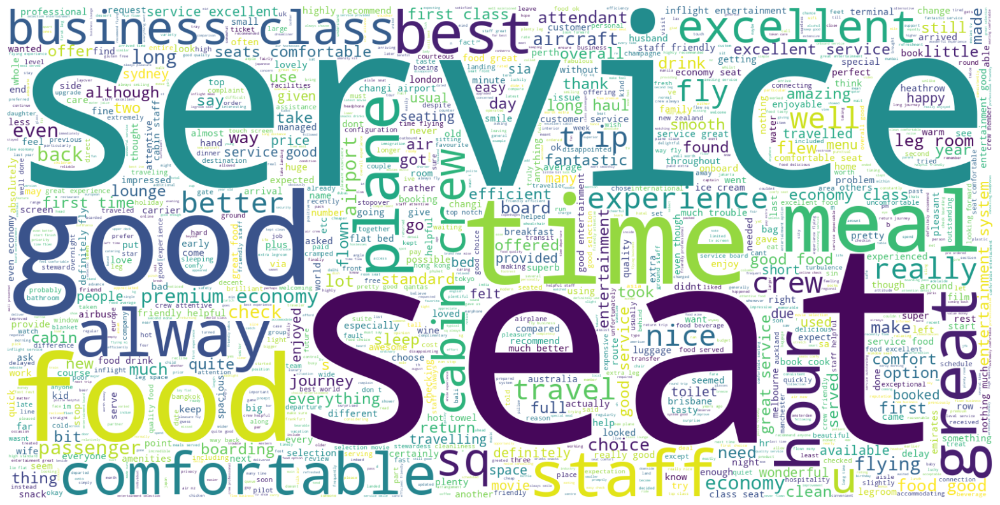

In [ ]:
positive_texts = df_2019[df_2019['Sentiment'] == 'positive']['Text']

# Create positive WordCloud for 2019
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800).generate(" ".join(positive_texts))

plt.figure(figsize=(20, 20))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

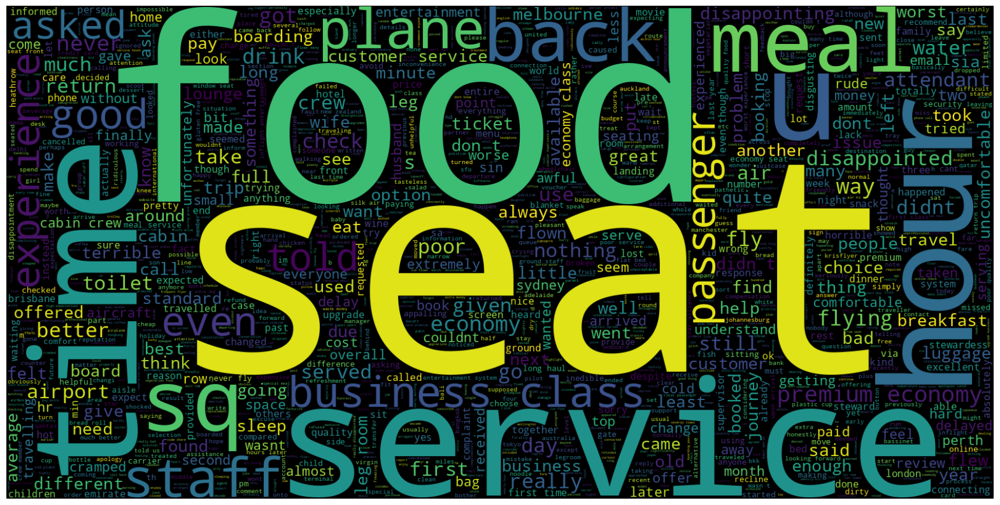

In [ ]:
negative_texts = df_2019[df_2019['Sentiment'] == 'negative']['Text']

# Create negative WordCloud for 2019

wc = WordCloud(background_color='black', max_words=2000, width=1600, height=800).generate(" ".join(negative_texts))

plt.figure(figsize=(20, 20))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

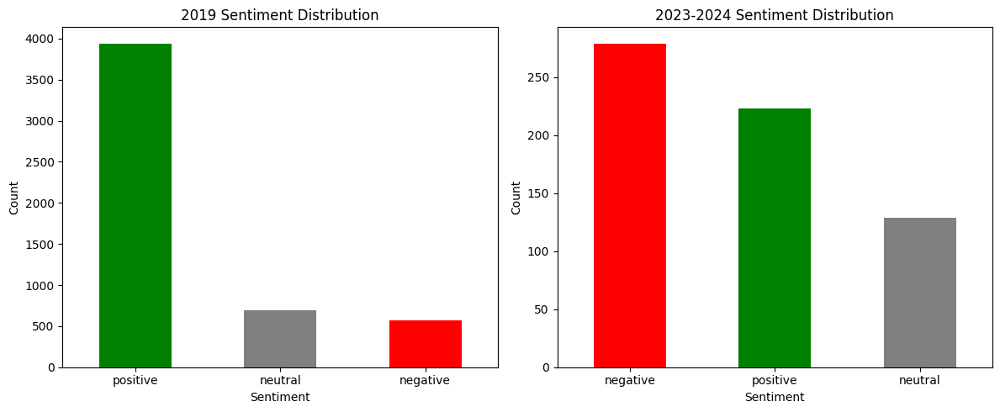

In [50]:
import matplotlib.pyplot as plt

# Comparing differences in sentiment distribution between 2019 and 2023-2024
sentiment_counts_2019 = df_2019['Sentiment'].value_counts()
sentiment_counts_2023_2024 = df1['Sentiment'].value_counts()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
# 2019 Bar Chart
sentiment_counts_2019.plot(kind='bar', color=['green', 'grey', 'red'], ax=ax1)
ax1.set_title('2019 Sentiment Distribution')
ax1.set_xlabel('Sentiment')
ax1.set_ylabel('Count')
ax1.set_xticklabels(sentiment_counts_2019.index, rotation=0)
#2023-2024 Bar Chart
sentiment_counts_2023_2024.plot(kind='bar', color=['red', 'green', 'grey'], ax=ax2)
ax2.set_title('2023-2024 Sentiment Distribution')
ax2.set_xlabel('Sentiment')
ax2.set_ylabel('Count')
ax2.set_xticklabels(sentiment_counts_2023_2024.index, rotation=0)

plt.tight_layout()
plt.show()


**LDA**

In [51]:
pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 18.0 MB/s eta 0:00:00


In [52]:
pip install contractions

In [95]:
import unicodedata
import re
import contractions
import string
#Gensim
import gensim
import gensim.corpora as corpora
#spacy
import spacy
#vis
import pyLDAvis
import pyLDAvis.gensim_models

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [161]:
# Cleaning and removing the above stop words list from the text column in new_df
stop_words = stopwords.words('english')
new_stopwords = ["sq", "much", "us"]
stop_words.extend(new_stopwords)

def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])

# Apply a function that cleans up deactivated words to the ‘text’ column of new_df
df1['Text'] = df1['Text'].apply(lambda text: cleaning_stopwords(text))
print(df1['Text'].head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0    used go london heathrow issues tickets cancell...
1    service suites class nothing excellent cabin c...
2    booked paid received email confirmation extra ...
3    best world seats food service brilliant crew f...
4    premium economy seating narrow seats poor leg ...
Name: Text, dtype: object


In [162]:
df1['Text'].isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0

In [163]:
df1_no_nans=df1.dropna()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [164]:
def generate_tokens(text):
    words=[]
    for word in text.split(' '):
    # using the if condition because we introduced extra spaces during text cleaning
         # if word != '' and word not in stop_words:
        if word!='':
           words.append(word)
    return words
#storing the generated tokens in a new column named 'tokens'
df1_no_nans['tokens']=df1_no_nans.Text.apply(generate_tokens)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [165]:
print(df1_no_nans.head())

                                                Text Sentiment  \
0  used go london heathrow issues tickets cancell...  positive   
1  service suites class nothing excellent cabin c...   neutral   
2  booked paid received email confirmation extra ...  negative   
3  best world seats food service brilliant crew f...  positive   
4  premium economy seating narrow seats poor leg ...  negative   

                                              tokens  
0  [used, go, london, heathrow, issues, tickets, ...  
1  [service, suites, class, nothing, excellent, c...  
2  [booked, paid, received, email, confirmation, ...  
3  [best, world, seats, food, service, brilliant,...  
4  [premium, economy, seating, narrow, seats, poo...  


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [166]:
def create_dictionary(words):
    return corpora.Dictionary(words)
id2word=create_dictionary(df1_no_nans['tokens'])
print(id2word)

Dictionary<6645 unique tokens: ['airport', 'amounts', 'arm', 'attentive', 'away']...>


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [167]:
def create_document_matrix(tokens,id2word):
    corpus = []
    for text in tokens:
        corpus.append(id2word.doc2bow(text))
    return corpus
#passing the dataframe column having tokens and dictionary
corpus=create_document_matrix(df1_no_nans['tokens'],id2word)
print(df1_no_nans['tokens'][0])
print(corpus[0])

['used', 'go', 'london', 'heathrow', 'issues', 'tickets', 'cancelled', 'tickets', 'trying', 'get', 'sorted', 'cost', 'lot', 'money', 'due', 'roaming', 'charges', 'lengthy', 'phone', 'calls', 'needed', 'get', 'ticket', 'reinstated', 'trying', 'charge', 'varying', 'amounts', 'resolve', 'poor', 'service', 'got', 'airport', 'check', 'desk', 'due', 'issue', 'meant', 'online', 'check', 'couldnt', 'done', 'premium', 'economy', 'spacious', 'two', 'seats', 'either', 'side', 'plane', 'seats', 'middle', 'plane', 'seemed', 'relatively', 'new', 'brand', 'new', 'legroom', 'good', 'seats', 'wider', 'bigger', 'arm', 'rest', 'two', 'seats', 'fold', 'away', 'tray', 'tables', 'good', 'choice', 'movies', 'things', 'tv', 'shows', 'games', 'etc', 'food', 'ok', 'didnt', 'seem', 'different', 'economy', 'standard', 'crew', 'seemed', 'friendly', 'enough', 'didnt', 'really', 'go', 'isles', 'drinks', 'maybe', 'twice', 'whole', 'hour', 'would', 'done', 'quite', 'often', 'overall', 'ok', 'seats', 'comfy', 'legroom'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [168]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=10, random_state=100, )

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [169]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6     -0.026492  0.016272       1        1  24.155263
1      0.001610  0.011094       2        1  15.131431
2     -0.030006  0.043961       3        1  14.715474
9      0.028496 -0.004021       4        1  13.148813
8      0.047878 -0.016414       5        1   9.264308
0      0.047108  0.031113       6        1   8.996777
4      0.010300  0.045893       7        1   6.065251
3      0.013283 -0.044782       8        1   4.580414
5     -0.062971 -0.029374       9        1   2.539936
7     -0.029206 -0.053743      10        1   1.402333, topic_info=            Term        Freq       Total Category  logprob  loglift
25       economy  324.000000  324.000000  Default  30.0000  30.0000
93         would  249.000000  249.000000  Default  29.0000  29.0000
255         seat  314.000000  314.000000  Default  28.0000  28.0000
32          food  331.000000  331.000000  Default  27.0000  27.0000
329         call   76.000000   76.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
498       lounge    1.486111   85.930358  Topic10  -6.0902   0.2097
828          sin    1.393819   65.580812  Topic10  -6.1543   0.4158
160         even    1.571299  167.348011  Topic10  -6.0345  -0.4011
134  comfortable    1.416295   83.899446  Topic10  -6.1383   0.1855
35           get    1.462920  188.184740  Topic10  -6.1060  -0.5900

[813 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
6348      1  0.506346  abandoned
402       1  0.097720       able
402       2  0.234527       able
402       3  0.097720       able
402       4  0.156351       able
...     ...       ...        ...
5174      8  0.739556       yuck
4612      6  0.635833        yvr
5618      5  0.629916  “managed”
1196      2  0.553804    “wasn’t
4613      6  0.636029        “we

[1927 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 2, 3, 10, 9, 1, 5, 4, 6, 8])

In [170]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim import corpora
from gensim.models.ldamodel import LdaModel

# Standard NLTK stop words
stop_words = set(stopwords.words('english'))

# Add custom stop words
custom_stop_words = ['would', 'told', 'get', 'even']  # Add more as needed
stop_words.update(custom_stop_words)

# Preprocess the documents
texts = [[word for word in word_tokenize(doc.lower()) if word.isalpha() and word not in stop_words] for doc in df1['Text']]

# Create a dictionary and corpus
# doc2bow converts a document into the BoW format; Each tuple consists of two elements: the word's integer ID and its frequency in the document.
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Apply LDA
num_topics = 7
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)

# Print the topics
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Topic: 0 
Words: 0.019*"economy" + 0.013*"service" + 0.010*"premium" + 0.009*"seat" + 0.008*"seats" + 0.008*"class" + 0.007*"food" + 0.006*"good" + 0.005*"time" + 0.005*"meal"
Topic: 1 
Words: 0.012*"crew" + 0.009*"service" + 0.007*"sia" + 0.005*"experience" + 0.004*"bags" + 0.004*"meals" + 0.004*"excellent" + 0.004*"never" + 0.004*"airport" + 0.003*"luggage"
Topic: 2 
Words: 0.010*"service" + 0.008*"refund" + 0.008*"customer" + 0.007*"airport" + 0.006*"passengers" + 0.005*"crew" + 0.005*"hour" + 0.005*"time" + 0.005*"check" + 0.005*"hours"
Topic: 3 
Words: 0.012*"service" + 0.011*"seat" + 0.011*"food" + 0.009*"seats" + 0.009*"economy" + 0.009*"crew" + 0.009*"class" + 0.008*"great" + 0.008*"business" + 0.007*"cabin"
Topic: 4 
Words: 0.012*"service" + 0.011*"food" + 0.009*"good" + 0.008*"time" + 0.007*"crew" + 0.007*"staff" + 0.005*"like" + 0.005*"experience" + 0.005*"economy" + 0.004*"could"
Topic: 5 
Words: 0.009*"service" + 0.007*"class" + 0.007*"seat" + 0.006*"business" + 0.006*"tim

In [178]:
# Create a topic name
topic_names = {
    0: "Economy Class Upgrade Experience",
    1: "Cabin Crew Service",
    2: "Post-Sales Service and Service Efficiency",
    3: "Business Class Experience",
    4: "Meal and Service",
    5: "Time managment and passenger experience",
    6: "Luggage Handling and Airport Services"
}



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [179]:
# Print the topics with names
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} - {} \nWords: {}'.format(idx, topic_names[idx], topic))


Topic: 0 - Economy Class Upgrade Experience 
Words: 0.019*"economy" + 0.013*"service" + 0.010*"premium" + 0.009*"seat" + 0.008*"seats" + 0.008*"class" + 0.007*"food" + 0.006*"good" + 0.005*"time" + 0.005*"meal"
Topic: 1 - Cabin Crew Service 
Words: 0.012*"crew" + 0.009*"service" + 0.007*"sia" + 0.005*"experience" + 0.004*"bags" + 0.004*"meals" + 0.004*"excellent" + 0.004*"never" + 0.004*"airport" + 0.003*"luggage"
Topic: 2 - Post-Sales Service and Service Efficiency 
Words: 0.010*"service" + 0.008*"refund" + 0.008*"customer" + 0.007*"airport" + 0.006*"passengers" + 0.005*"crew" + 0.005*"hour" + 0.005*"time" + 0.005*"check" + 0.005*"hours"
Topic: 3 - Business Class Experience 
Words: 0.012*"service" + 0.011*"seat" + 0.011*"food" + 0.009*"seats" + 0.009*"economy" + 0.009*"crew" + 0.009*"class" + 0.008*"great" + 0.008*"business" + 0.007*"cabin"
Topic: 4 - Meal and Service 
Words: 0.012*"service" + 0.011*"food" + 0.009*"good" + 0.008*"time" + 0.007*"crew" + 0.007*"staff" + 0.005*"like" + 0

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [180]:
for i, doc in enumerate(corpus):
    doc_topics = lda_model.get_document_topics(doc)
    print(f"Document {i} Topics:")
    for topic, prob in doc_topics:
        # Name of the corresponding topic
        topic_name = topic_names[topic]
        print(f"Topic {topic}: {topic_name} - {prob:.4f}")
    print("\n")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Document 0 Topics:
Topic 0: Economy Class Upgrade Experience - 0.7537
Topic 4: Meal and Service - 0.2403


Document 1 Topics:
Topic 0: Economy Class Upgrade Experience - 0.9979


Document 2 Topics:
Topic 3: Business Class Experience - 0.7934
Topic 5: Time managment and passenger experience - 0.1899


Document 3 Topics:
Topic 0: Economy Class Upgrade Experience - 0.0119
Topic 1: Cabin Crew Service - 0.0119
Topic 2: Post-Sales Service and Service Efficiency - 0.0119
Topic 3: Business Class Experience - 0.9284
Topic 4: Meal and Service - 0.0119
Topic 5: Time managment and passenger experience - 0.0119
Topic 6: Luggage Handling and Airport Services - 0.0119


Document 4 Topics:
Topic 0: Economy Class Upgrade Experience - 0.9852


Document 5 Topics:
Topic 4: Meal and Service - 0.5625
Topic 5: Time managment and passenger experience - 0.4242


Document 6 Topics:
Topic 4: Meal and Service - 0.9591


Document 7 Topics:
Topic 0: Economy Class Upgrade Experience - 0.9494


Document 8 Topics:
Top

In [181]:
# Select the topic with the highest probability for each document from the printout as the topic for the corresponding document.
document_topics = [max(lda_model.get_document_topics(doc), key=lambda item: item[1])[0] for doc in corpus]

for i, topic in enumerate(document_topics):
    topic_name = topic_names[topic]
    print(f"Document {i} Topic: {topic} - {topic_name}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Document 0 Topic: 0 - Economy Class Upgrade Experience
Document 1 Topic: 0 - Economy Class Upgrade Experience
Document 2 Topic: 3 - Business Class Experience
Document 3 Topic: 3 - Business Class Experience
Document 4 Topic: 0 - Economy Class Upgrade Experience
Document 5 Topic: 4 - Meal and Service
Document 6 Topic: 4 - Meal and Service
Document 7 Topic: 0 - Economy Class Upgrade Experience
Document 8 Topic: 6 - Luggage Handling and Airport Services
Document 9 Topic: 4 - Meal and Service
Document 10 Topic: 5 - Time managment and passenger experience
Document 11 Topic: 0 - Economy Class Upgrade Experience
Document 12 Topic: 0 - Economy Class Upgrade Experience
Document 13 Topic: 4 - Meal and Service
Document 14 Topic: 5 - Time managment and passenger experience
Document 15 Topic: 0 - Economy Class Upgrade Experience
Document 16 Topic: 4 - Meal and Service
Document 17 Topic: 5 - Time managment and passenger experience
Document 18 Topic: 3 - Business Class Experience
Document 19 Topic: 3 

In [182]:
document_topic_names = [topic_names[topic] for topic in document_topics]
df1['Topic'] = document_topic_names

# Print the df1 to verify the results
print(df1[['Text', 'Topic']])

                                                  Text  \
0    used go london heathrow issues tickets cancell...   
1    service suites class nothing excellent cabin c...   
2    booked paid received email confirmation extra ...   
3    best world seats food service brilliant crew f...   
4    premium economy seating narrow seats poor leg ...   
..                                                 ...   
626  best service best hospitality staffs polite fe...   
627  flew several december time service good sin sf...   
628  lost checked bags trip make matters worse maki...   
629  delightful experience attendants attentive acc...   
630  checked baggage time received travelling weddi...   

                                Topic  
0    Economy Class Upgrade Experience  
1    Economy Class Upgrade Experience  
2           Business Class Experience  
3           Business Class Experience  
4    Economy Class Upgrade Experience  
..                                ...  
626                  Me

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [183]:
df1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Text,Sentiment,Topic
0,used go london heathrow issues tickets cancell...,positive,Economy Class Upgrade Experience
1,service suites class nothing excellent cabin c...,neutral,Economy Class Upgrade Experience
2,booked paid received email confirmation extra ...,negative,Business Class Experience
3,best world seats food service brilliant crew f...,positive,Business Class Experience
4,premium economy seating narrow seats poor leg ...,negative,Economy Class Upgrade Experience
...,...,...,...
626,best service best hospitality staffs polite fe...,positive,Meal and Service
627,flew several december time service good sin sf...,neutral,Business Class Experience
628,lost checked bags trip make matters worse maki...,negative,Cabin Crew Service
629,delightful experience attendants attentive acc...,positive,Meal and Service


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


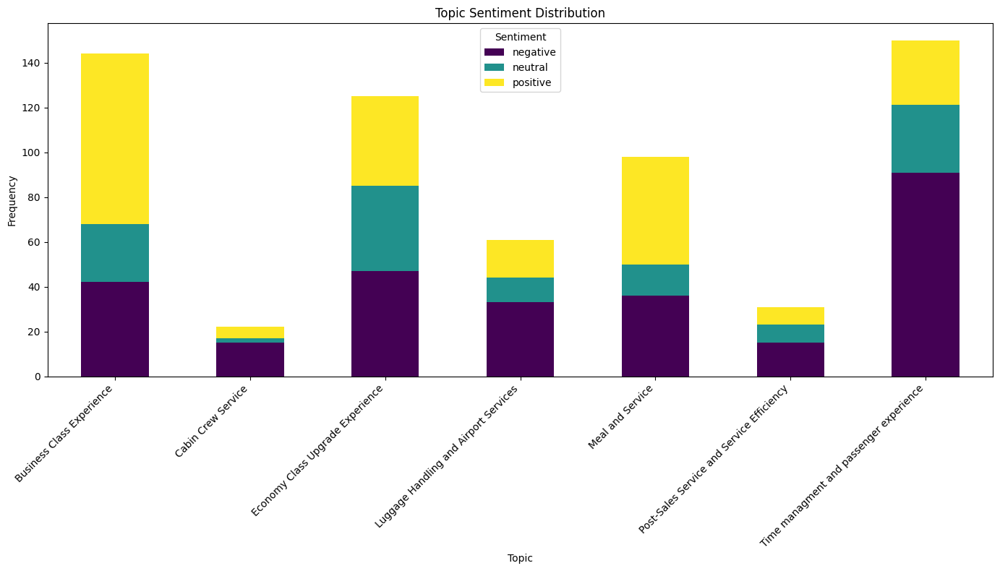

In [184]:
import matplotlib.pyplot as plt

# Group ‘Topic’ and ‘Sentiment’ and count them.
topic_sentiment_counts = df1.groupby(['Topic', 'Sentiment']).size().unstack(fill_value=0)


fig, ax = plt.subplots(figsize=(14, 8))

# Plotting stacked bar charts
topic_sentiment_counts.plot(kind='bar', stacked=True, colormap='viridis', ax=ax)
plt.xlabel('Topic')
plt.ylabel('Frequency')
plt.title('Topic Sentiment Distribution')
plt.xticks(rotation=45, ha="right")
plt.legend(title='Sentiment')
plt.tight_layout()
plt.show()
